In [1]:
import torch
import torch.nn as nn
import numpy as np
import hw_utils

# Assignment 6: Deep learning
##### [Instruction](https://mattabrown.github.io/425/assignments/Assignment6.html)
##### Name: Yeongu Choe
##### Student number: 77672566

## Part 1: Neural network

### Part 1.1: ReLU Activation

In [2]:
class nn_ReLU():
    def __init__(self):
        pass

    def forward(self, X: np.ndarray):
        assert isinstance(X, np.ndarray)
        # START
        # Step1: change negative element to 0 from tensor X
        out = np.where(X < 0, 0, X)
        # END
        assert isinstance(out, np.ndarray)
        assert out.shape == X.shape
        return out

    def backward(self, X: np.ndarray):
        # compute the gradient of y with respect to X
        # where y = ReLU(X)
        gradient_of_ReLu = np.ones_like(X)
        # START
        # Step1: Find indice of negative element in the tensor X
        negative_index_list = np.where(X < 0)
        # Step2: change the value of grad where X is negative
        gradient_of_ReLu[negative_index_list] = 0
        # END
        return gradient_of_ReLu

hw_utils.test_relu(in_shape=[7, 5, 3, 1], Layer=nn_ReLU)
hw_utils.test_relu(in_shape=[100], Layer=nn_ReLU)
hw_utils.test_relu(in_shape=[3, 4, 4], Layer=nn_ReLU)

norm(out_np - out_torch) = 0.000000
norm(out_np - out_torch) = 0.000000
norm(out_np - out_torch) = 0.000000


### Part 1.2: Maxpooling Layer

In [3]:
class nn_MaxPool2d():
    def __init__(self, kernel_size):
        self.kernel_size = kernel_size

    def forward(self, X: np.ndarray):
        assert isinstance(X, np.ndarray)
        # check if X is a 4D tensor like (N, C, size, size)
        assert len(X.shape) == 4
        # check if X is a square, by checking size are the same
        assert X.shape[2] == X.shape[3]
        # get the size of the input tensor
        N, C, size, _ = X.shape
        # check if input tensor X is bigger than kernel
        assert size >= self.kernel_size
        # kernel is the pooling window
        kernel_size = self.kernel_size
        # stride is the kernel size
        stride = kernel_size
        # START
        # Step1: out_size is tensor size after pooling process
        out_size = size//kernel_size
        # Step2: create a tensor in the size of (N, C, out_size, out_size)
        out = np.zeros((N, C, out_size, out_size))
        # Step3: for each element in the output tensor, find the max value in the corresponding pooling window
        for i in range(N):
            for j in range(C):
                for k in range(out_size):
                    for l in range(out_size):
                        # Step4: Find maximum value in the pooling window
                        max_value = np.max(
                            X[i, j, k*kernel_size:k*kernel_size+stride, l*kernel_size:l*kernel_size+stride])
                        # Step5: Set the value to every element in the pooling window
                        out[i, j, k, l] = max_value
        # END
        # Step6: reshape so that the fixed tensor X's size is not lost
        out = out.reshape(N, C, out_size, out_size)
        return out


hw_utils.test_maxpool(N=3, C=6, size=4, kernel_size=1, Layer=nn_MaxPool2d)
hw_utils.test_maxpool(N=3, C=6, size=4, kernel_size=2, Layer=nn_MaxPool2d)
hw_utils.test_maxpool(N=3, C=6, size=4, kernel_size=4, Layer=nn_MaxPool2d)

hw_utils.test_maxpool(N=3, C=6, size=16, kernel_size=4, Layer=nn_MaxPool2d)
hw_utils.test_maxpool(N=3, C=6, size=16, kernel_size=8, Layer=nn_MaxPool2d)

hw_utils.test_maxpool(N=3, C=6, size=15, kernel_size=4, Layer=nn_MaxPool2d)
hw_utils.test_maxpool(N=3, C=6, size=15, kernel_size=8, Layer=nn_MaxPool2d)

hw_utils.test_maxpool(N=3, C=6, size=13, kernel_size=4, Layer=nn_MaxPool2d)
hw_utils.test_maxpool(N=3, C=6, size=13, kernel_size=8, Layer=nn_MaxPool2d)

norm(out_np - out_torch) = 0.000002
norm(out_np - out_torch) = 0.000002
norm(out_np - out_torch) = 0.000001
norm(out_np - out_torch) = 0.000005
norm(out_np - out_torch) = 0.000002
norm(out_np - out_torch) = 0.000003
norm(out_np - out_torch) = 0.000001
norm(out_np - out_torch) = 0.000003
norm(out_np - out_torch) = 0.000001


### Part 1.3: Linear Layer

$$
f(x_{i},W,b)=W x_{i} + b
$$

In [4]:
class nn_Linear():
    def __init__(self, in_features: int, out_features: int):
        self.W = np.random.rand(in_features, out_features)
        self.b = np.random.rand(1, out_features)

    def forward(self, X: np.ndarray):
        assert isinstance(X, np.ndarray)
        # check if input tensor X is 2D
        assert len(X.shape) == 2
        N, D = X.shape

        # START

        # X: image features
        # self.W: weights
        # self.b: bias vector
        # Step1: Weight*X+bias
        y = np.matmul(X, self.W)+self.b
        # END

        assert len(y.shape) == 2
        assert y.shape[0] == N
        return y

    def load_weights(self, W, b):
        W = W.T
        b = b.reshape(1, -1)
        assert W.shape == self.W.shape
        assert b.shape == self.b.shape
        self.W = W
        self.b = b


hw_utils.test_linear(N=3, D=4, K=5, Layer=nn_Linear)
hw_utils.test_linear(N=5, D=6, K=7, Layer=nn_Linear)
hw_utils.test_linear(N=1, D=4, K=5, Layer=nn_Linear)
hw_utils.test_linear(N=1, D=1, K=1, Layer=nn_Linear)
hw_utils.test_linear(N=2, D=1, K=1, Layer=nn_Linear)
hw_utils.test_linear(N=1, D=2, K=2, Layer=nn_Linear)

norm(out_np - out_torch) = 0.000001
norm(out_np - out_torch) = 0.000001
norm(out_np - out_torch) = 0.000000
norm(out_np - out_torch) = 0.000000
norm(out_np - out_torch) = 0.000001
norm(out_np - out_torch) = 0.000000


### Part 1.4: Convolution Layer

In [5]:
class nn_Conv2d():
    def __init__(self, in_channels, out_channels, kernel_size):
        assert kernel_size % 2 == 1, "We assume the kernel_size to be odd."
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = kernel_size  # 5x5

        # START
        self.linear = nn_Linear(
            self.kernel_size*self.kernel_size*self.in_channels, 1*1*out_channels)
        # END

    def forward(self, X):
        assert isinstance(X, np.ndarray)
        assert len(X.shape) == 4
        assert X.shape[2] == X.shape[3]
        N, C, size, _ = X.shape
        assert size >= self.kernel_size
        kernel_size = self.kernel_size
        # START
        out_size = size-kernel_size+1
        out = np.zeros((N, self.out_channels, out_size, out_size))

        for i in range(out_size):
            for j in range(out_size):
                # Extract kernel from X which share the same position accross all images
                kernel = X[:, :, i:i+kernel_size, j:j+kernel_size]
                # reshape kernel to (N, kernel_size*kernel_size*self.in_channels)
                kernel = np.reshape(
                    kernel, (N, kernel_size*kernel_size*self.in_channels))
                # calculate convolution
                out[:, :, i, j] = self.linear.forward(kernel)

        # END
        assert len(out.shape) == 4
        assert out.shape[0] == X.shape[0]
        assert out.shape[1] == self.out_channels
        assert out.shape[2] == out.shape[3]
        return out

    def load_weights(self, W, b):
        self.linear.load_weights(W, b)

hw_utils.test_conv2d(N=4, D=5, K=6, size=3, kernel_size=3, Layer=nn_Conv2d)
hw_utils.test_conv2d(N=4, D=5, K=6, size=5, kernel_size=3, Layer=nn_Conv2d)
hw_utils.test_conv2d(N=4, D=5, K=6, size=10, kernel_size=3, Layer=nn_Conv2d)
hw_utils.test_conv2d(N=1, D=5, K=6, size=5, kernel_size=3, Layer=nn_Conv2d)
hw_utils.test_conv2d(N=4, D=5, K=1, size=5, kernel_size=3, Layer=nn_Conv2d)
hw_utils.test_conv2d(N=4, D=1, K=6, size=3, kernel_size=3, Layer=nn_Conv2d)
hw_utils.test_conv2d(N=1, D=1, K=1, size=5, kernel_size=3, Layer=nn_Conv2d)
hw_utils.test_conv2d(N=4, D=5, K=6, size=10, kernel_size=1, Layer=nn_Conv2d)
hw_utils.test_conv2d(N=4, D=5, K=6, size=10, kernel_size=5, Layer=nn_Conv2d)
hw_utils.test_conv2d(N=4, D=5, K=6, size=10, kernel_size=7, Layer=nn_Conv2d)

norm(out_np - out_torch) = 0.000022
norm(out_np - out_torch) = 0.000070
norm(out_np - out_torch) = 0.000226
norm(out_np - out_torch) = 0.000027
norm(out_np - out_torch) = 0.000020
norm(out_np - out_torch) = 0.000012
norm(out_np - out_torch) = 0.000003
norm(out_np - out_torch) = 0.000088
norm(out_np - out_torch) = 0.000158
norm(out_np - out_torch) = 0.000185


## Part2: Experiment

In [6]:
train_loader, val_loader, test_loader = hw_utils.fetch_data()

100%|██████████| 170498071/170498071 [00:06<00:00, 28339089.47it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified
len(train_set) = 5000, len(val_set) = 5000, len(test_set) = 5000


<img src="https://github.com/GrandChampion/A6/blob/main/structure.png?raw=1" width="500">

### Part 2.1: number of epochs
* Epoch: one complete cycle through the entire training dataset while updating the weights and biases during the learning process.

#### Part 2.1.1: Underfit Network
* An underfit network is observed when $Epoch=4$.
* Validation loss decreases and validation accuracy increases until the epoch is 4.

  0%|          | 0/4 [00:00<?, ?it/s]

The highest validation accuracy is 47.36 percent
The highest training accuracy is 53.14 percent


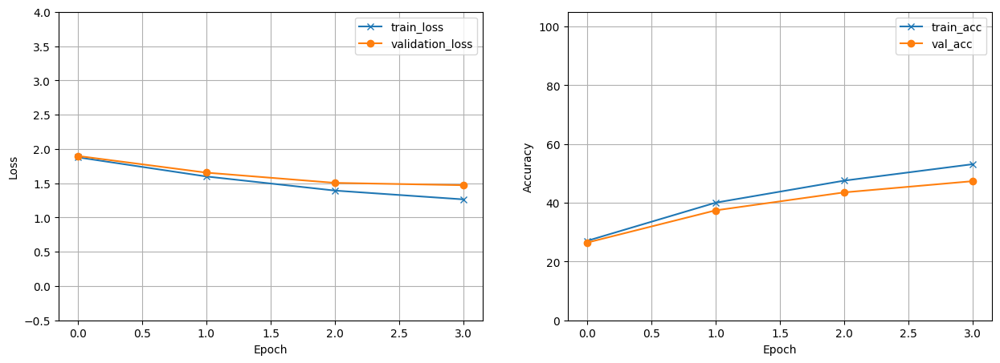

In [7]:
# Underfit
# epoch = 4
args = {
    'lr': 1e-3,
    'epoch': 4,
    'channel1': 128,
    'channel2': 256,
    'mid_dims': [512, 512],
    'act_name': 'relu',
    'device': 'cuda'
}
trained_model = hw_utils.spawn_train_show(
    args, train_loader, val_loader, print_model=False, print_loss=False)

#### Part 2.1.2: Overfit network
* An overfit network is observed when $Epoch=15$.
* While the training loss continues to decrease, the validation loss starts to increase, indicating that the model is overfitting beyond epoch 4.

  0%|          | 0/15 [00:00<?, ?it/s]

The highest validation accuracy is 47.82 percent
The highest training accuracy is 80.72 percent


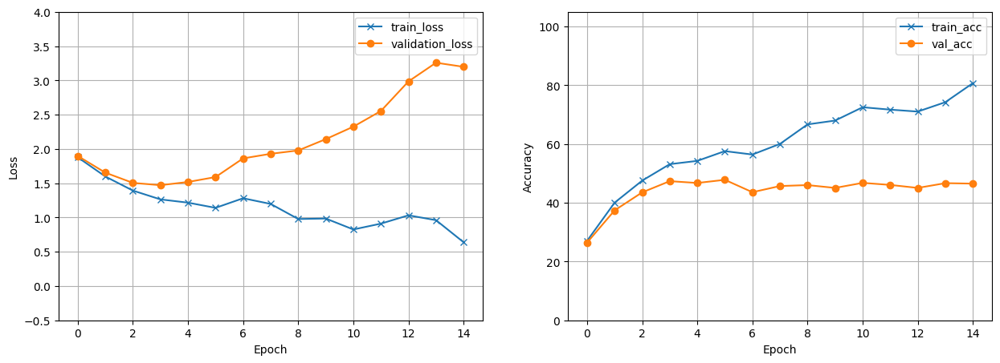

In [8]:
# Overfit
# epoch = 15
args = {
    'lr': 1e-3,
    'epoch': 15,
    'channel1': 128,
    'channel2': 256,
    'mid_dims': [512, 512],
    'act_name': 'relu',
    'device': 'cuda'
}
trained_model = hw_utils.spawn_train_show(
    args, train_loader, val_loader, print_model=False, print_loss=False)

### Part 2.2: Channel Sizes
* channel1: Number of neurons in the input layer.
* channel2: Number of neurons in the output layer.

#### Part 2.2.1 Underfit Network
* An underfit network is observed when $channel1=1$, $channel2=1$.
* The decrease in validation loss and increase in validation accuracy indicate that it is an underfit network.

  0%|          | 0/20 [00:00<?, ?it/s]

The highest validation accuracy is 32.38 percent
The highest training accuracy is 45.32 percent


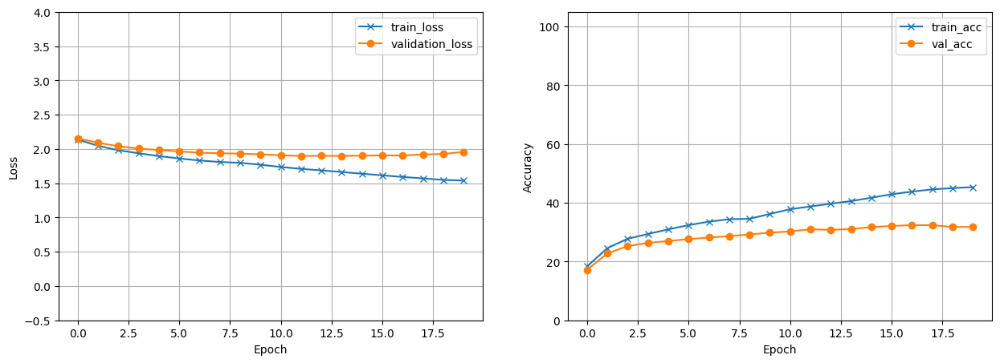

In [9]:
# Underfit
# channel1 = 1
# channel2 = 1
args = {
    'lr': 1e-3,
    'epoch': 20,
    'channel1': 1,
    'channel2': 1,
    'mid_dims': [256, 256],
    'act_name': 'relu',
    'device': 'cuda'
}
trained_model = hw_utils.spawn_train_show(
    args, train_loader, val_loader, print_model=False, print_loss=False)

#### Part 2.2.2 Overfit Network
* An overfit network is observed when $channel1=30$, $channel2=30$.
* The increase in validation loss while the training loss decreases indicates that it is an overfit network.

  0%|          | 0/20 [00:00<?, ?it/s]

The highest validation accuracy is 50.06 percent
The highest training accuracy is 92.74 percent


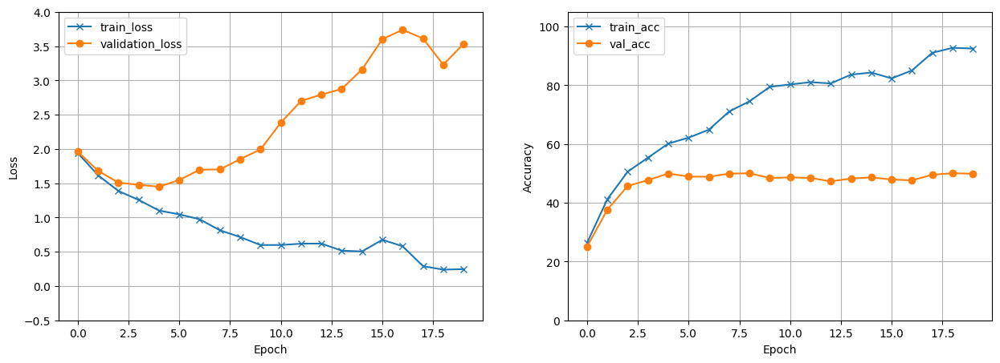

In [10]:
# Overfit
# channel1 = 30
# channel2 = 30
args = {
    'lr': 1e-3,
    'epoch': 20,
    'channel1': 30,
    'channel2': 30,
    'mid_dims': [256, 256],
    'act_name': 'relu',
    'device': 'cuda'
}
trained_model = hw_utils.spawn_train_show(
    args, train_loader, val_loader, print_model=False, print_loss=False)

### Part 2.3: Hidden Layer

#### Part 2.3.1: Underfit network
* Having 5 neurons in one layer and 3 neurons in another layer resulted in an underfit network.
* The validation loss remained relatively stable while the validation accuracy was increasing, indicating that it is an underfit network.

  0%|          | 0/20 [00:00<?, ?it/s]

The highest validation accuracy is 36.48 percent
The highest training accuracy is 50.48 percent


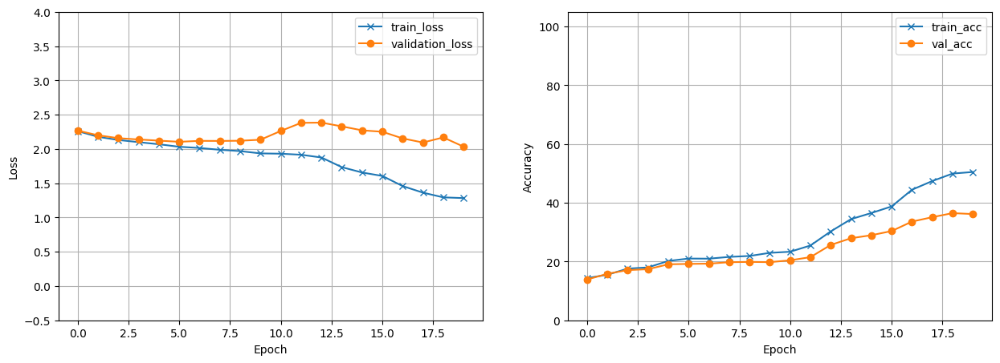

In [11]:
# Underfit
# neurons in the first hidden layer = 5
# neurons in the second hidden layer = 3
args = {
    'lr': 1e-3,
    'epoch': 20,
    'channel1': 256,
    'channel2': 256,
    'mid_dims': [5, 3],
    'act_name': 'relu',
    'device': 'cuda'
}
trained_model = hw_utils.spawn_train_show(
    args, train_loader, val_loader, print_model=False, print_loss=False)

#### Part 2.3.2: Overfit network
* Having 50 neurons in one layer and 30 neurons in another layer resulted in an overfit network.
* The increase in validation loss while the training loss decreases indicates that it is an overfit network.

  0%|          | 0/20 [00:00<?, ?it/s]

The highest validation accuracy is 50.30 percent
The highest training accuracy is 74.10 percent


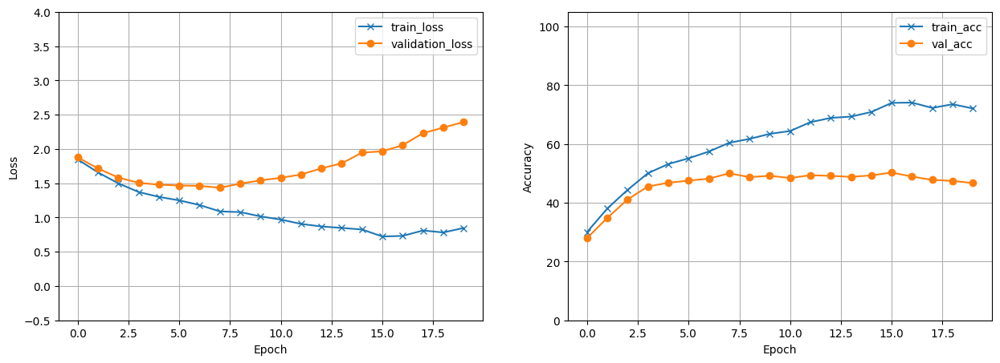

In [12]:
# Overfit
# neurons in the first hidden layer = 50
# neurons in the second hidden layer = 30
args = {
    'lr': 1e-3,
    'epoch': 20,
    'channel1': 256,
    'channel2': 256,
    'mid_dims': [50, 30],
    'act_name': 'relu',
    'device': 'cuda'
}
trained_model = hw_utils.spawn_train_show(
    args, train_loader, val_loader, print_model=False, print_loss=False)

### Part 2.4: Layer Depth

### Part 2.4.1: Underfit network
* Using 10 filters in the layers resulted in an underfit network.
* The validation loss decreased as the number of epochs increased, indicating that it is an underfit network.

  0%|          | 0/20 [00:00<?, ?it/s]

The highest validation accuracy is 34.22 percent
The highest training accuracy is 41.26 percent


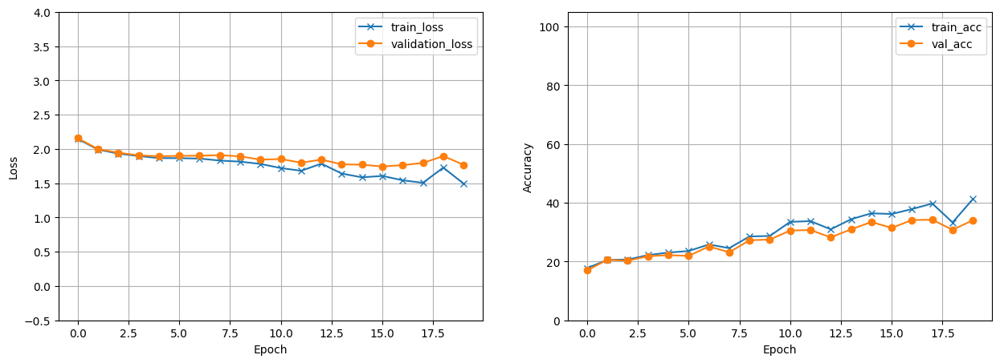

In [13]:
# Underfit
# depth: 10
args = {
    'lr': 1e-3,
    'epoch': 20,
    'channel1': 256,
    'channel2': 256,
    'mid_dims': [256]*10,
    'act_name': 'relu',
    'device': 'cuda'
}
trained_model = hw_utils.spawn_train_show(
    args, train_loader, val_loader, print_model=False, print_loss=False)

### Part 2.4.2: Overfit network
* Using 1 filter in the layers resulted in an overfit network.
* The increase in validation loss while the training loss decreases indicates that it is an overfit network.

  0%|          | 0/20 [00:00<?, ?it/s]

The highest validation accuracy is 49.90 percent
The highest training accuracy is 85.54 percent


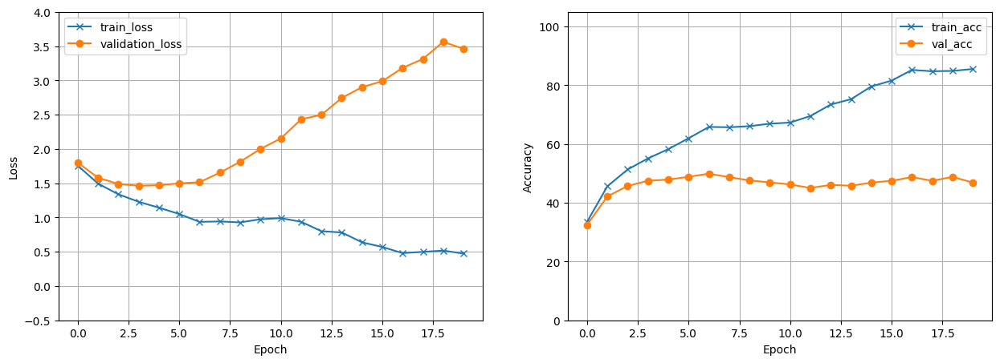

In [14]:
# Overfit
# depth: 1
args = {
    'lr': 1e-3,
    'epoch': 20,
    'channel1': 256,
    'channel2': 256,
    'mid_dims': [256]*1,
    'act_name': 'relu',
    'device': 'cuda'
}
trained_model = hw_utils.spawn_train_show(
    args, train_loader, val_loader, print_model=False, print_loss=False)

### Part 2.5: Activation function

#### Part 2.5.1: Underfit network
* Using sigmoid activation function resulted in an underfit network.

  0%|          | 0/20 [00:00<?, ?it/s]

The highest validation accuracy is 10.10 percent
The highest training accuracy is 10.40 percent


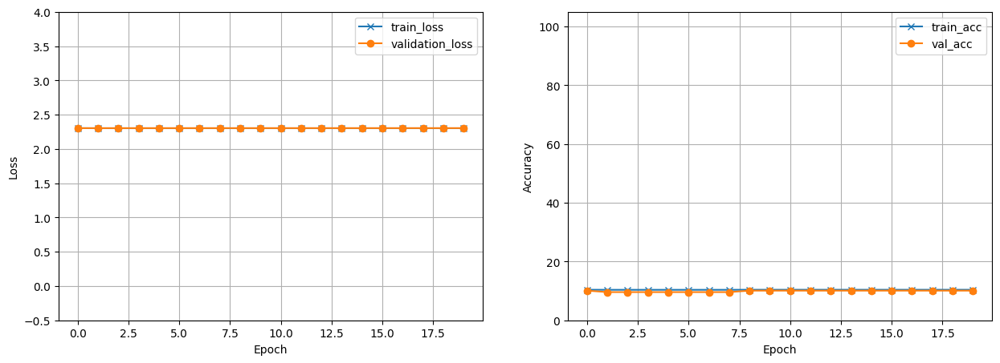

In [15]:
# Underfit
# activation function: sigmoid
args = {
    'lr': 1e-3,
    'epoch': 20,
    'channel1': 128,
    'channel2': 256,
    'mid_dims': [512, 512],
    'act_name': 'sigmoid',
    'device': 'cuda'
}
trained_model = hw_utils.spawn_train_show(
    args, train_loader, val_loader, print_model=False, print_loss=False)

#### Part 2.5.2: Overfit network
* Using the ReLU (Rectified Linear Unit) activation function resulted in an overfit network.

  0%|          | 0/20 [00:00<?, ?it/s]

The highest validation accuracy is 49.46 percent
The highest training accuracy is 92.94 percent


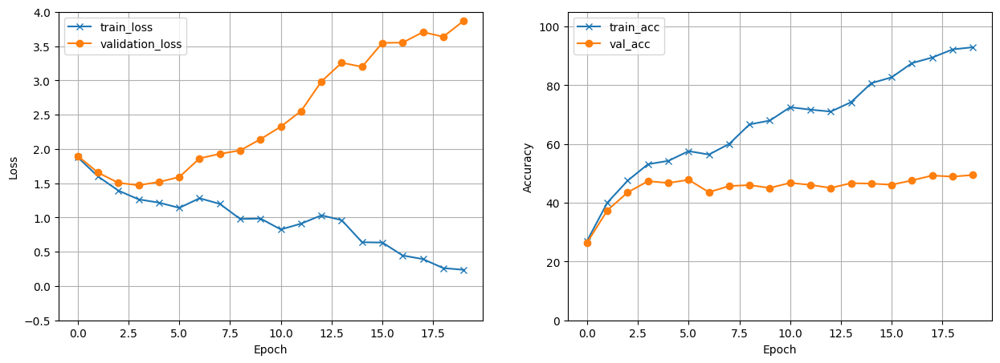

In [16]:
# Overfit
# activation function: ReLu
args = {
    'lr': 1e-3,
    'epoch': 20,
    'channel1': 128,
    'channel2': 256,
    'mid_dims': [512, 512],
    'act_name': 'relu',
    'device': 'cuda'
}
trained_model = hw_utils.spawn_train_show(
    args, train_loader, val_loader, print_model=False, print_loss=False)

### Part 2.6: Worst and best model

#### Part 2.6.1: Worst hyperparameter set

  0%|          | 0/4 [00:00<?, ?it/s]

The highest validation accuracy is 9.60 percent
The highest training accuracy is 10.38 percent


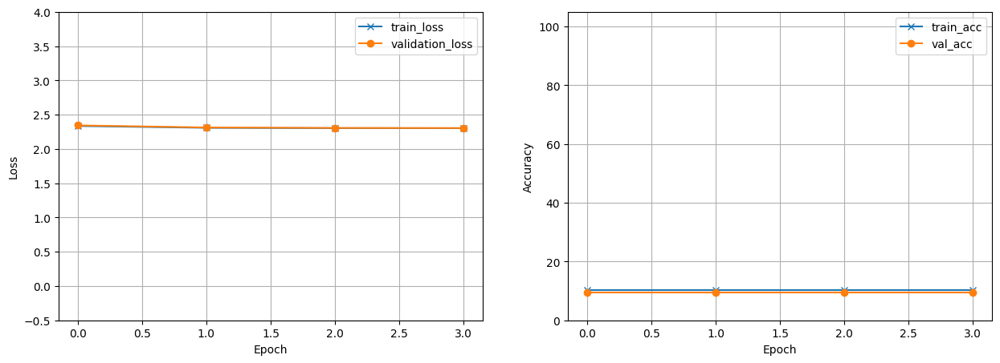

In [17]:
# Worst
args = {
    'lr': 1e-3,
    'epoch': 4,
    'channel1': 1,
    'channel2': 1,
    'mid_dims': [5,3]*10,
    'act_name': 'sigmoid',
    'device': 'cuda'
}
trained_model = hw_utils.spawn_train_show(
    args, train_loader, val_loader, print_model=False, print_loss=False)

##### Hyperparameter set of the worst model
* epoch: 4
* channel1: 1
* channel2: 1
* hidden layer: [5,3]
* depth: 10
* activation function: sigmoid
* Highest training accuracy:  10.38%
* Highest validation accuracy: 9.6%.

In [18]:
_, test_acc = hw_utils.test(args, trained_model, test_loader)
print('The test accuracy is %.2f percent' % (test_acc))

The test accuracy is 10.14 percent


#### Part 2.6.2 Best hyperparameter set

  0%|          | 0/15 [00:00<?, ?it/s]

The highest validation accuracy is 51.00 percent
The highest training accuracy is 75.48 percent


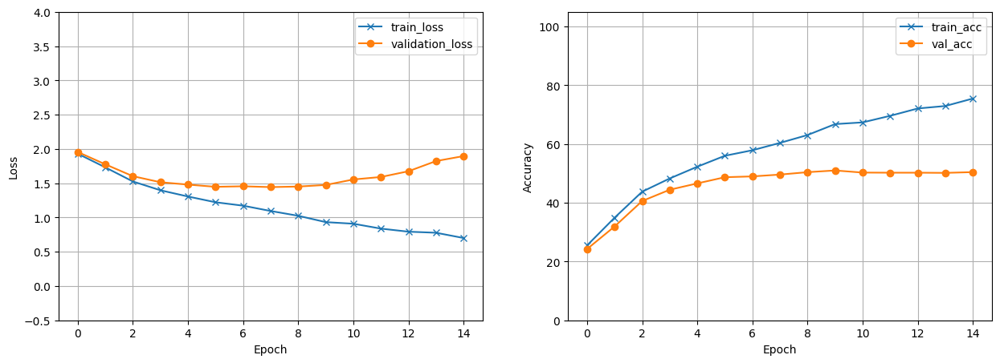

In [19]:
# Best
args = {
    'lr': 1e-3,
    'epoch': 15,
    'channel1': 30,
    'channel2': 30,
    'mid_dims': [50,30]*1,
    'act_name': 'relu',
    'device': 'cuda'
}
trained_model = hw_utils.spawn_train_show(
    args, train_loader, val_loader, print_model=False, print_loss=False)

In [20]:
_, test_acc = hw_utils.test(args, trained_model, test_loader)
print('The test accuracy is %.2f percent' % (test_acc))

The test accuracy is 50.48 percent


##### Hyperparameter set of the best model
* epoch: 15
* channel1: 30
* channel2: 30
* hidden layer: [50,30]
* depth: 1
* activation function: relu
* Highest training accuracy:  75.48%
* Highest validation accuracy: 51%.

## Part3: Object recognition with Mask R-CNN

In [21]:
import hw_utils
import torchvision
device = 'cuda'
model = torchvision.models.detection.maskrcnn_resnet50_fpn(
    pretrained=True).to(device)
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:02<00:00, 88.8MB/s]


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

Visualizing birb.jpg
Resized image size: 600, 401


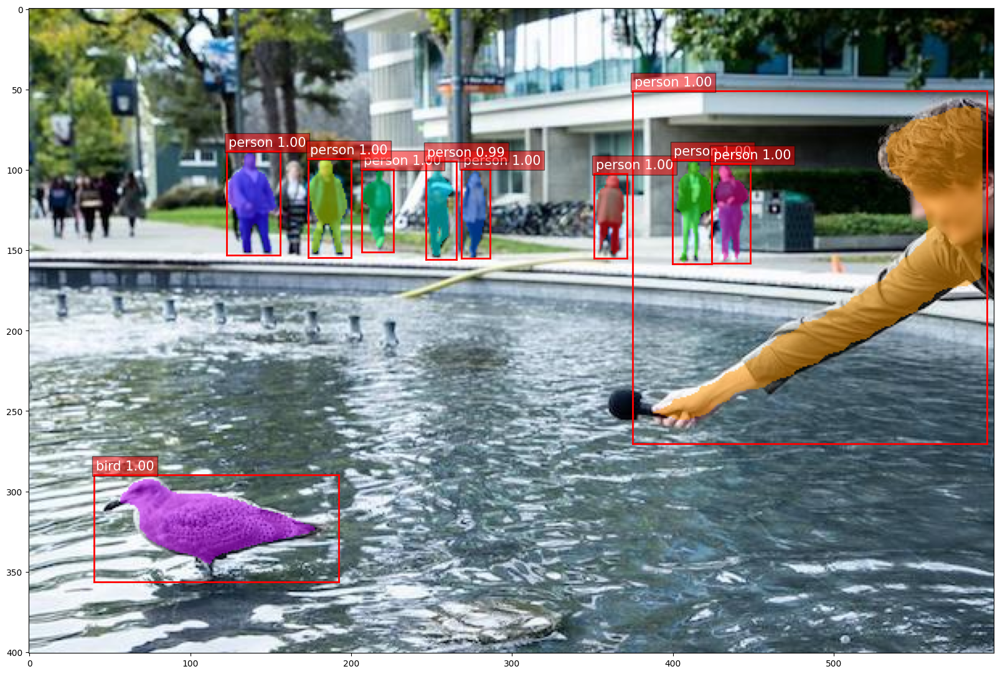

In [22]:
hw_utils.apply_mask_rcnn(
    im_path='birb.jpg', model=model, device=device, topk=10)

### Part 3.1: Positive Example

Visualizing livingroom.jpeg
Resized image size: 600, 399


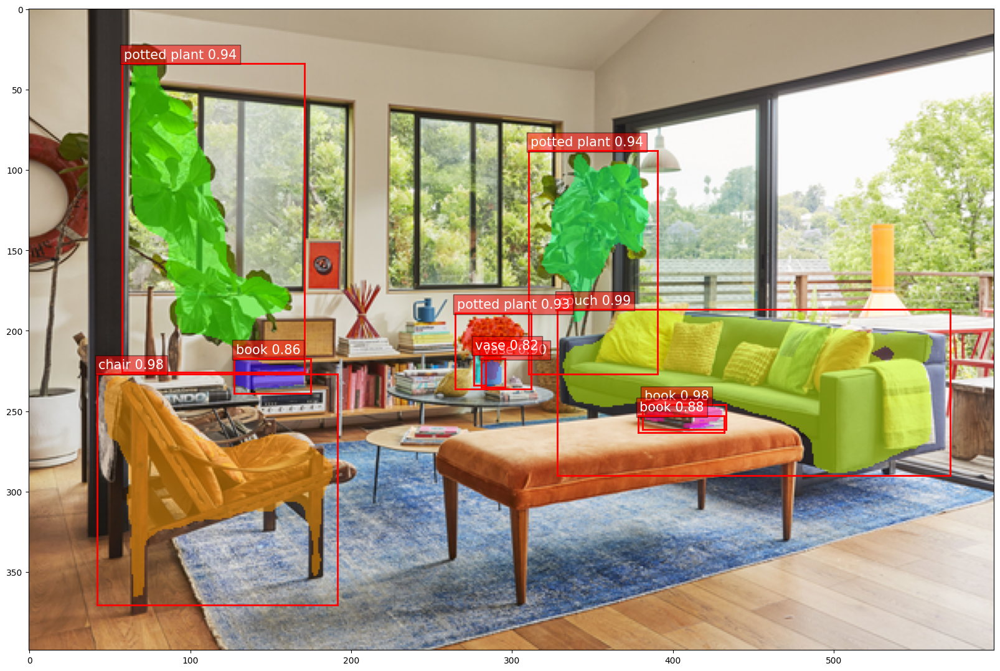

In [23]:
hw_utils.apply_mask_rcnn(im_path='livingroom.jpeg',
                         model=model, device=device, topk=10)

### Part 3.2: Negative Examples

Visualizing sheep.jpeg
Resized image size: 600, 449


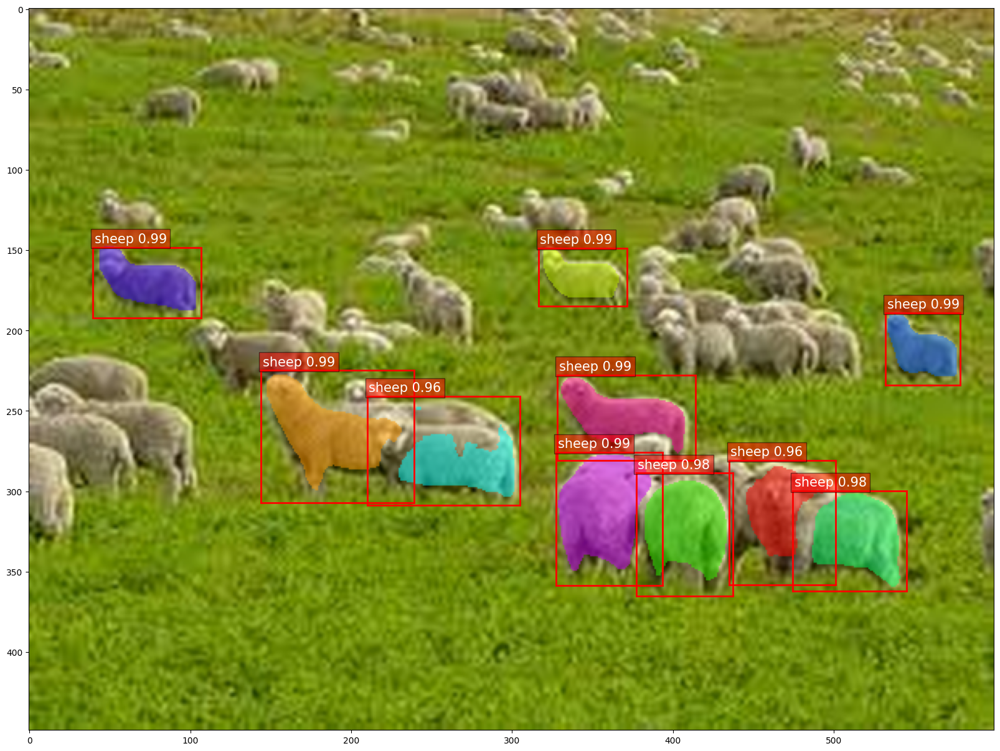

In [24]:
hw_utils.apply_mask_rcnn(im_path='sheep.jpeg',
                         model=model, device=device, topk=10)

Visualizing nyc.jpeg
Resized image size: 600, 337


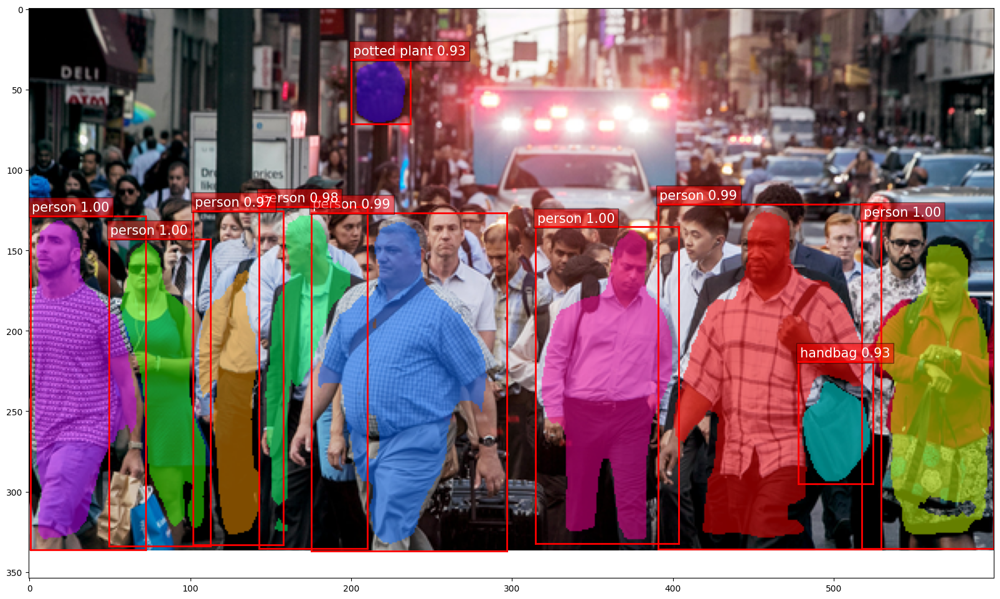

In [25]:
hw_utils.apply_mask_rcnn(im_path='nyc.jpeg',
                         model=model, device=device, topk=10)

### Part 3.3: Report
#### When does object detection work well?
* High resolution image: A high-definition image enhances the system's ability to identify the contents accurately.

#### When does object detection work poorly?
* Complex background: Images with complex backgrounds make object detection challenging.
* Blurry image: When a picture is blurry, it becomes difficult to accurately label the object.
* Occluded objects: If parts of an object are hidden or covered by another object in an image, labeling becomes challenging for the object detection.

# Submission Instructions

- Include all plots and answers on this Jupyter notebook.
- Download the Jupyter notebook with the created plots and answers.
- Submit your notebook using the naming convention `firstname_lastname_student_id.ipynb` on Canvas.

© 2020 Zicong Fan and Leonid Sigal All Rights Reserved